# Import Librerie

In [1]:
!pip install mlflow
!pip install dagshub

In [2]:
import os
import matplotlib.pyplot as plt
import numpy as np
import time
from tqdm import tqdm
from PIL import Image
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Activation, Dropout, Flatten, Dense, Input, Layer
from tensorflow.keras.layers import BatchNormalization, Conv2DTranspose, LeakyReLU, Reshape, Activation
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from keras.preprocessing import image
import keras.backend as K
import copy
import json

from sklearn.model_selection import train_test_split

# MLflow

In [3]:
import mlflow
import mlflow.keras
import dagshub
import itertools


dagshub.init(repo_owner='simoLoc', repo_name='ProgettoSE4AI', mlflow=True)
mlflow.set_experiment("GAN Image Generation")

❗❗❗ AUTHORIZATION REQUIRED ❗❗❗



Open the following link in your browser to authorize the client:
https://dagshub.com/login/oauth/authorize?state=2ef5c1db-1c7e-4c65-a167-ede407591899&client_id=32b60ba385aa7cecf24046d8195a71c07dd345d9657977863b52e7748e0f0f28&middleman_request_id=0f07b238d688a323aead2c024066fe93d739d5d7cac0eebb4eaf7bf78f9f7411




Output()

Accessing as simoLoc

Initialized MLflow to track repo "simoLoc/ProgettoSE4AI"

Repository simoLoc/ProgettoSE4AI initialized!

<Experiment: artifact_location='mlflow-artifacts:/268eb364cf3944b796305a4300cd0dfd', creation_time=1748592428054, experiment_id='1', last_update_time=1748592428054, lifecycle_stage='active', name='GAN Image Generation', tags={}>

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Apertura immagini

In [5]:
noise_dim = 100
n_class = 4
tags = ['Black', 'Asian', 'Indian', 'Others']
img_size = 200

data_dir = '/content/drive/Shareddrives/ProgettoSE4AI/datasetUTK/'
img_dir = '/content/drive/Shareddrives/ProgettoSE4AI/datasetUTK/images_filtered_UTKFace'

ethnicity_list = []
images_path = []
age_list = []
gender_list = []

for filename in os.listdir(img_dir):
  if filename.endswith('.jpg'):
    path = os.path.join(img_dir, filename)
    age, gender, ethnicity = map(int, filename.replace('.jpg', '').split('_')[:3])

    # img = tf.io.read_file(path)
    # img = tf.image.decode_jpeg(img, channels=3)
    # # Effettua il resize dell'immagine a 200*200
    # img = tf.image.resize(img, [img_size, img_size])
    # # Normalizza in [0,1] i valori dei px che sono nel range [0,255]
    # img = tf.cast(img, tf.float32) / 255.0
    # X.append(img)

    images_path.append(path)
    ethnicity_list.append(ethnicity)
    age_list.append(age)
    gender_list.append(gender)

# Convertiamo le liste in tensori
images_path = tf.constant(images_path)
ethnicity_list = tf.constant(ethnicity_list, dtype=tf.int32)
age_list = tf.constant(age_list, dtype=tf.int32)
gender_list = tf.constant(gender_list, dtype=tf.int32)

# Funzione di preprocess
@tf.function
def parse_image(path, ethnicity):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  img = tf.image.resize(img, [img_size, img_size])
  img = tf.cast(img, tf.float32) / 255.0
  # Per importare tali valori nel range [-1,1] dobbiamo usare questa formula alternativa
  # in quanto non sono più nel range [0,255] ma essendo tensori sono stati convertiti
  # nel range [0,1]
  img = (img * 2.0) - 1.0
  return img, ethnicity

# Crea dataset ottimizzato

def create_dataset(paths, ethnicity, age, gender, batch_size=32, shuffle_buffer=1000):
  AUTOTUNE = tf.data.AUTOTUNE

  ds_paths = tf.data.Dataset.from_tensor_slices(images_path)
  ds_ethnicity = tf.data.Dataset.from_tensor_slices(ethnicity_list)
  ds_age = tf.data.Dataset.from_tensor_slices(age)
  ds_gender = tf.data.Dataset.from_tensor_slices(gender)

  dataset = tf.data.Dataset.zip((ds_paths, ds_ethnicity, ds_age, ds_gender))
  dataset = dataset.shuffle(shuffle_buffer)
  dataset = dataset.map(
    lambda path, eth, a, g: (
        parse_image(path, eth)[0],
        {
            'ethnicity': tf.one_hot(eth, depth=n_class),
            'age': tf.cast(a, tf.float32),
            'gender': tf.cast(g, tf.float32)
        }
    ),
    num_parallel_calls=AUTOTUNE
  )
  dataset = dataset.batch(batch_size)
  dataset = dataset.prefetch(AUTOTUNE)
  return dataset

# Esempio di utilizzo
# batch_size = 64

# for images, labels in dataset.take(1):
#   print(images.shape)
#   print({k: v.shape for k, v in labels.items()})


# dataset = tf.data.Dataset.from_tensor_slices((X_np, y_np, age_list, gender_list))

Randomly selected index: 684
Label at selected index: 4
Age at selected index: 36
Gender at selected index: 1
Unique labels in y_train: [1 2 3 4]


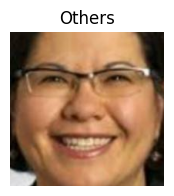

In [6]:
plt.figure(figsize=(2,2))

# images_path = tf.convert_to_tensor(X_train, dtype=tf.float32)

idx = np.random.randint(0,len(images_path))

img_to_display_path = images_path[idx]

img_raw = tf.io.read_file(img_to_display_path)
img_tensor = tf.image.decode_jpeg(img_raw, channels=3)
img_tensor = tf.image.resize(img_tensor, [img_size, img_size])
# Convert to numpy array for matplotlib/keras.preprocessing
img_to_display = img_tensor.numpy().astype('uint8')

img = image.array_to_img(img_to_display, scale=True)
plt.imshow(img)
plt.axis('off')

# --- Diagnostic additions ---
print(f"Randomly selected index: {idx}")
print(f"Label at selected index: {ethnicity_list[idx]}")
print(f"Age at selected index: {age_list[idx]}")
print(f"Gender at selected index: {gender_list[idx]}")
print(f"Unique labels in y_train: {np.unique(ethnicity_list)}")
# --- End of diagnostic additions ---

plt.title(tags[ethnicity_list[idx]-1])
plt.show()

# Definizione dei modelli

## Definizione Loss

In [7]:
bce_loss = tf.keras.losses.BinaryCrossentropy()

def discriminator_loss(real, fake):
    real_loss = bce_loss(tf.ones_like(real), real)
    fake_loss = bce_loss(tf.zeros_like(fake), fake)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(preds):
    return bce_loss(tf.ones_like(preds), preds)


In [8]:
# Funzione presa da https://www.geeksforgeeks.org/conditional-gans-cgans-for-image-generation/#implementation-of-conditional-gan
# MODIFICATA considerando il notebook delle GAN iniziale

def build_generator():
    noise_input = layers.Input(shape=(noise_dim,))
    label_input = layers.Input(shape=(n_class,))

    merged_input = layers.Concatenate()([noise_input, label_input])

    x = layers.Dense(25 * 25 * 128)(noise_input)
    x = layers.Reshape((25, 25, 128))(x)

    x = layers.Conv2DTranspose(128, kernel_size=5, strides=2, padding="same")(x)  # 50x50
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="same")(x)   # 100x100
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="same")(x)   # 200x200
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    output_img = layers.Conv2D(3, kernel_size=5, padding="same", activation="tanh")(x)  # 200x200x3

    model = models.Model([noise_input, label_input], output_img)
    return model

g_model = build_generator()
g_model.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 100)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 80000)     │  8,080,000 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 25, 25,    │          0 │ dense[0][0]       │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose    │ (None, 50, 50,    │    409,728 │ reshape[0][0]     │
│ (Conv2DTranspose)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 50, 50,    │        512 │ conv2d_transpose… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 50, 50,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_1  │ (None, 100, 100,  │    204,864 │ leaky_re_lu[0][0] │
│ (Conv2DTranspose)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 100, 100,  │        256 │ conv2d_transpose… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 100, 100,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_2  │ (None, 200, 200,  │    102,464 │ leaky_re_lu_1[0]… │
│ (Conv2DTranspose)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 200, 200,  │        256 │ conv2d_transpose… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 200, 200,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_1       │ (None, 4)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 200, 200,  │      4,803 │ leaky_re_lu_2[0]… │
│                     │ 3)                │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 8,802,883 (33.58 MB)

 Trainable params: 8,802,371 (33.58 MB)

 Non-trainable params: 512 (2.00 KB)

In [9]:
def build_discriminator():

  img_input = layers.Input(shape=(200, 200, 3))
  label_input = layers.Input(shape=(n_class,))

  # Flatten the image input
  flat_img = layers.Flatten()(img_input)

  # Concatenate flattened image and label inputs
  merged_input = layers.Concatenate()([flat_img, label_input])

  x = layers.Dense(512)(merged_input)
  x = layers.LeakyReLU(alpha=0.2)(x)
  x = layers.Dense(512)(x)
  x = layers.LeakyReLU(alpha=0.2)(x)
  validity = layers.Dense(1, activation='sigmoid')(x)

  model = models.Model([img_input, label_input], validity)
  return model


d_model = build_discriminator()
d_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 120000)    │          0 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_3       │ (None, 4)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 120004)    │          0 │ flatten[0][0],    │
│ (Concatenate)       │                   │            │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 512)       │ 61,442,560 │ concatenate_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 512)       │          0 │ dense_1[0][0]     │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 512)       │    262,656 │ leaky_re_lu_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_4       │ (None, 512)       │          0 │ dense_2[0][0]     │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 1)         │        513 │ leaky_re_lu_4[0]… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 61,705,729 (235.39 MB)

 Trainable params: 61,705,729 (235.39 MB)

 Non-trainable params: 0 (0.00 B)

# Training

In [10]:
# Compiles the train_step function into a callable TensorFlow graph
# @tf.function
def train_step(real_images, real_ethnicity, real_age, real_gender, d_optimizer, g_optimizer, batch_size):
    # real_images, real_ethnicity, real_age, real_gender = dataset

    batch_size_real = tf.shape(real_images)[0]

    # One-hot encoding delle etichette reali
    # real_ethnicity_one_hot = tf.one_hot(real_ethnicity, depth=n_class, dtype=tf.float32)

    # ===> Campiona etichette casuali per immagini fake
    # random_labels = tf.random.uniform(shape=(batch_size, ), minval=0, maxval=n_class, dtype=tf.int32)
    # random_labels_one_hot = tf.one_hot(random_labels, depth=n_class, dtype=tf.float32)

    # ===> Genera immagini fake dal generatore
    random_latent_vectors = tf.random.normal(shape=(batch_size_real, noise_dim))
    generated_images = g_model([random_latent_vectors, real_ethnicity])

    # ===> Addestra il discriminatore
    with tf.GradientTape() as tape:
        pred_fake = d_model([generated_images, real_ethnicity])
        pred_real = d_model([real_images, real_ethnicity])

        d_loss = discriminator_loss(pred_real, pred_fake)

    grads = tape.gradient(d_loss, d_model.trainable_variables)
    d_optimizer.apply_gradients(zip(grads, d_model.trainable_variables))

    # ===> Addestra il generatore
    random_latent_vectors = tf.random.normal(shape=(batch_size_real, noise_dim))
    # random_labels = tf.random.uniform(shape=(batch_size, ), minval=0, maxval=n_class, dtype=tf.int32)
    # random_labels_one_hot = tf.one_hot(random_labels, depth=n_class, dtype=tf.float32)

    with tf.GradientTape() as tape:
        fake_images = g_model([random_latent_vectors, real_ethnicity])
        predictions = d_model([fake_images, real_ethnicity])
        g_loss = generator_loss(predictions)

    grads = tape.gradient(g_loss, g_model.trainable_variables)
    g_optimizer.apply_gradients(zip(grads, g_model.trainable_variables))

    return d_loss, g_loss, fake_images, real_ethnicity, real_age, real_gender, g_model, d_model


In [11]:
# Helper function to plot generated images
def show_samples(num_samples, n_class, g_model):
    fig, axes = plt.subplots(n_class, num_samples, figsize=(10,n_class*2))
    fig.tight_layout()
    fig.subplots_adjust(wspace=None, hspace=0.2)

    for l in np.arange(n_class):
      random_noise = tf.random.normal(shape=(num_samples, noise_dim))

      label = tf.one_hot([l] * num_samples, depth=n_class, dtype=tf.float32)
      gen_imgs = g_model.predict([random_noise, label])
      for j in range(gen_imgs.shape[0]):
        img = image.array_to_img(gen_imgs[j], scale=True)
        axes[l,j].imshow(img)
        axes[l,j].yaxis.set_ticks([])
        axes[l,j].xaxis.set_ticks([])

        if j ==0:
          axes[l,j].set_ylabel(tags[l])
    plt.show()

In [12]:
from datetime import datetime

def get_current_timestamp():
    return datetime.now().strftime('%Y%m%d%H%M%S%f')[:-3]

def save_generated_images(images, ages, genders, ethnicities, save_dir, total):
    """
    Salva le immagini generate dal generatore.

    images: tensore di immagini nel range [-1, 1]
    ages: lista di età
    genders: lista di generi
    labels: lista di etichette rappresentanti l'etnia
    save_dir: cartella dove salvare le immagini
    """
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    # Porta le immagini da [-1,1] a [0,255] se necessario
    if tf.reduce_min(images) < 0:
      images = (images + 1.0) / 2.0  # da [-1,1] a [0,1]
    images = tf.clip_by_value(images * 255.0, 0, 255)
    images = tf.cast(images, tf.uint8)

    # print(images.shape)

    for i in range(total):
        timestamp = get_current_timestamp()
        age = int(ages[i])
        gender = int(genders[i])
        ethnicity = int(ethnicities[i])

        filename = f'{age}_{gender}_{ethnicity}_{timestamp}.jpg.chip.jpg'
        path = os.path.join(save_dir, filename)

        # Salva immagine
        img = tf.image.encode_jpeg(images[i])
        tf.io.write_file(path, img)

    # print('Salvataggio completato')

In [13]:
def train(dataset, epochs, d_optimizer, g_optimizer, batch_size, learning_rate):
    d_loss_list = []
    g_loss_list = []
    g_loss_epoch = []
    d_loss_epoch = []

    for epoch in range(epochs):
      print('Epoch: ', epoch)
      # Liste per il salvataggio delle immagini generate
      fake_images_list = []
      ages_list = []
      genders_list = []
      ethnicity_list = []

      start = time.time()

      itern = 0
      total = 0

      for real_images_batch, labels_batch in tqdm(dataset):
        real_ethnicity = labels_batch['ethnicity']
        real_age = labels_batch['age']
        real_gender = labels_batch['gender']
        # Le immagini sono già nel primo elemento del tuple
        real_images = real_images_batch

        # Aggiunti parametri di ritorno fake_images, labels, age e gender
        d_loss, g_loss, fake_images, ethnicity_one_hot, ages, genders, g_model, d_model = train_step(real_images, real_ethnicity, real_age, real_gender, d_optimizer, g_optimizer, batch_size)
        ethnicity = tf.argmax(ethnicity_one_hot, axis=1) + 1
        d_loss_list.append(d_loss)
        g_loss_list.append(g_loss)
        itern=itern+1
        total += tf.shape(real_images)[0]
        batch_total = tf.shape(real_images)[0]

          # fake_images_list.append(fake_images)
          # ages_list.append(ages)
          # genders_list.append(genders)
          # ethnicity_list.append(ethnicity)

          # fake_images_list = tf.concat(fake_images, axis=0)
          # ages_list = tf.concat(ages, axis=0)
          # genders_list = tf.concat(genders, axis=0)
          # ethnicity_list = tf.concat(ethnicity, axis=0)

        if epoch == epochs - 1:
          save_generated_images(
            images=fake_images,
            ages=ages,
            genders=genders,
            ethnicities=ethnicity,
            save_dir= os.path.join(data_dir, f'images_generated_GAN_{batch_size}_{epochs}_{learning_rate}'),
            total=batch_total
          )

      g_loss_epoch.append(np.mean(g_loss_list))
      d_loss_epoch.append(np.mean(d_loss_list))

      show_samples(3, n_class, g_model)

      # if epoch == epochs - 1:
      #     fake_images_list = tf.concat(fake_images_list, axis=0)
      #     ages_list = tf.concat(ages_list, axis=0)
      #     genders_list = tf.concat(genders_list, axis=0)
      #     ethnicity_list = tf.concat(ethnicity_list, axis=0)

      #     print('\n\nShape delle liste')
      #     print(fake_images_list.shape)
      #     print(ages_list.shape)
      #     print(genders_list.shape)
      #     print(ethnicity_list.shape)

      #     print(total)

      #     save_generated_images(
      #       images=fake_images_list,
      #       ages=ages_list.numpy(),
      #       genders=genders_list.numpy(),
      #       ethnicities=ethnicity_list.numpy(),
      #       save_dir= os.path.join(data_dir, f'images_generated_GAN_{batch_size}_{epochs}_{learning_rate}'),
      #       total=total
      #     )

      print (f'Epoch: {epoch} -- Generator Loss: {np.mean(g_loss_epoch)}, Discriminator Loss: {np.mean(d_loss_epoch)}\n')
      print (f'Took {time.time()-start} seconds. \n\n')


    return np.mean(g_loss_epoch), np.mean(d_loss_epoch), g_model, d_model, g_loss_epoch, d_loss_epoch

In [14]:
all_history = []
best_score = float('inf') # Initialize best_score to infinity for minimum loss
best_d_model = None
best_g_model = None
best_run = None

In [15]:
# param_grid = {
#     'batch_size': [32, 64],
#     'epochs': [10, 15],
#     'learning_rate': [0.0001, 0.0003]
# }

param_grid = {
    'batch_size': [64],
    'epochs': [20],
    'learning_rate': [0.0003]
}

In [16]:
# start_index = 3  # Inizia dalla combinazione 4

# for i, (batch_size, epochs, learning_rate) in enumerate(combinations):
#     if i < start_index:
#         continue  # Salta le combinazioni già fatte

#     print(f"Training with batch_size={batch_size}, epochs={epochs}, learning_rate={learning_rate}")

#     # Prepara il dataset
#     dataset = create_dataset(images_path, ethnicity_list, age_list, gender_list, batch_size)

#     tf.keras.backend.clear_session()
#     g_model = build_generator()
#     d_model = build_discriminator()

#     d_optimizer = Adam(learning_rate=learning_rate, beta_1=0.5)
#     g_optimizer = Adam(learning_rate=learning_rate, beta_1=0.5)

#     with mlflow.start_run():
#         # Log iperparametri utilizzati
#         mlflow.log_param("batch_size", batch_size)
#         mlflow.log_param("epochs", epochs)
#         mlflow.log_param("learning_rate", learning_rate)

#         g_loss, d_loss, g_model, d_model, g_loss_list, d_loss_list = train(
#             dataset, epochs, d_optimizer, g_optimizer,
#             batch_size=batch_size, learning_rate=learning_rate
#         )

#         # Log delle loss del generatore e discriminatore
#         mlflow.log_metric("generator_loss", g_loss)
#         mlflow.log_metric("discriminator_loss", d_loss)

#         loss_mean = np.mean([g_loss, d_loss])

#         run = {
#             'batch_size': batch_size,
#             'epochs': epochs,
#             'learning_rate': learning_rate,
#             'g_loss': g_loss,
#             'd_loss': d_loss,
#             'g_loss_list': g_loss_list,
#             'd_loss_list': d_loss_list,
#         }
#         all_history.append(run)

#         if loss_mean < best_score:
#             best_score = loss_mean
#             best_run = run
#             best_d_model = copy.copy(d_model)
#             best_g_model = copy.copy(g_model)

Training with batch_size=64, epochs=20, learning_rate=0.0003
Epoch:  0


100%|██████████| 70/70 [04:22<00:00,  3.74s/it]


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


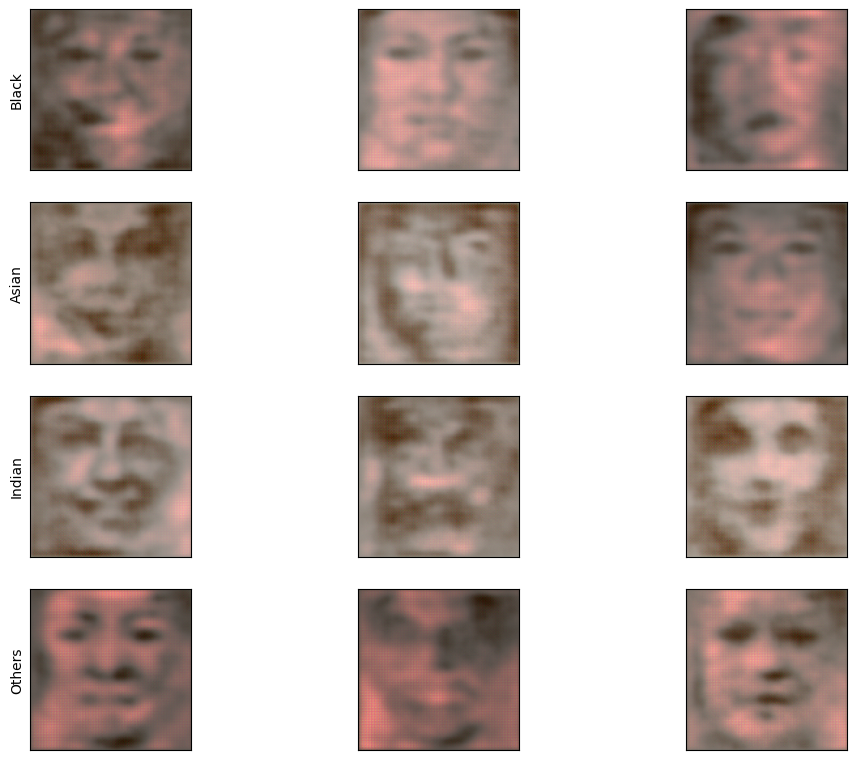

Epoch: 0 -- Generator Loss: 0.7744501233100891, Discriminator Loss: 1.787086844444275

Took 265.5600519180298 seconds. 


Epoch:  1


100%|██████████| 70/70 [01:21<00:00,  1.17s/it]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


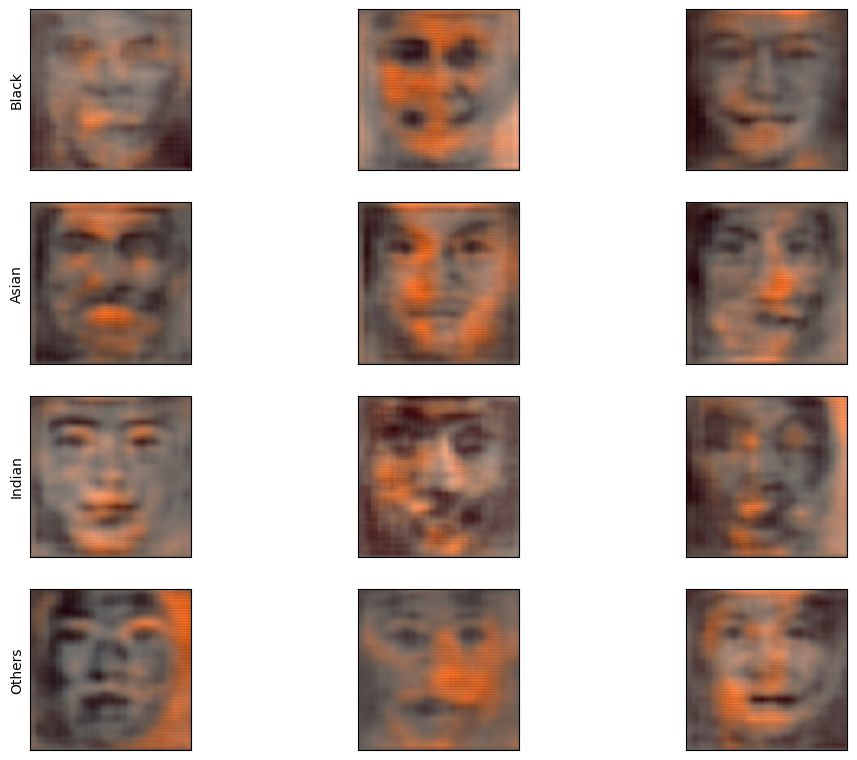

Epoch: 1 -- Generator Loss: 0.7376585006713867, Discriminator Loss: 1.8512325286865234

Took 83.41295337677002 seconds. 


Epoch:  2


100%|██████████| 70/70 [00:48<00:00,  1.43it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


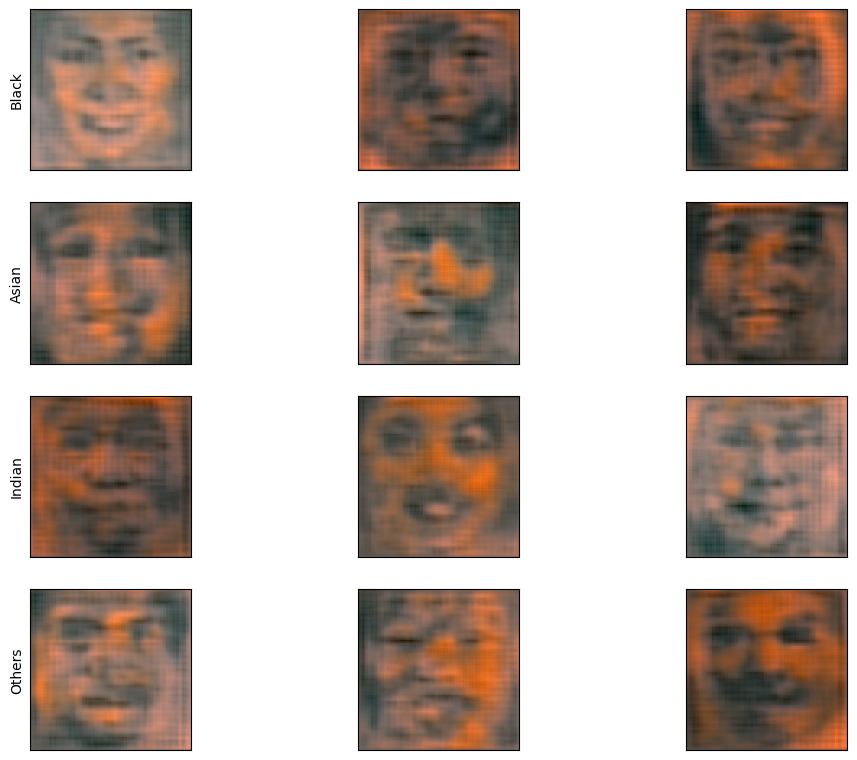

Epoch: 2 -- Generator Loss: 0.7340121269226074, Discriminator Loss: 1.8622571229934692

Took 50.15677785873413 seconds. 


Epoch:  3


100%|██████████| 70/70 [01:21<00:00,  1.17s/it]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


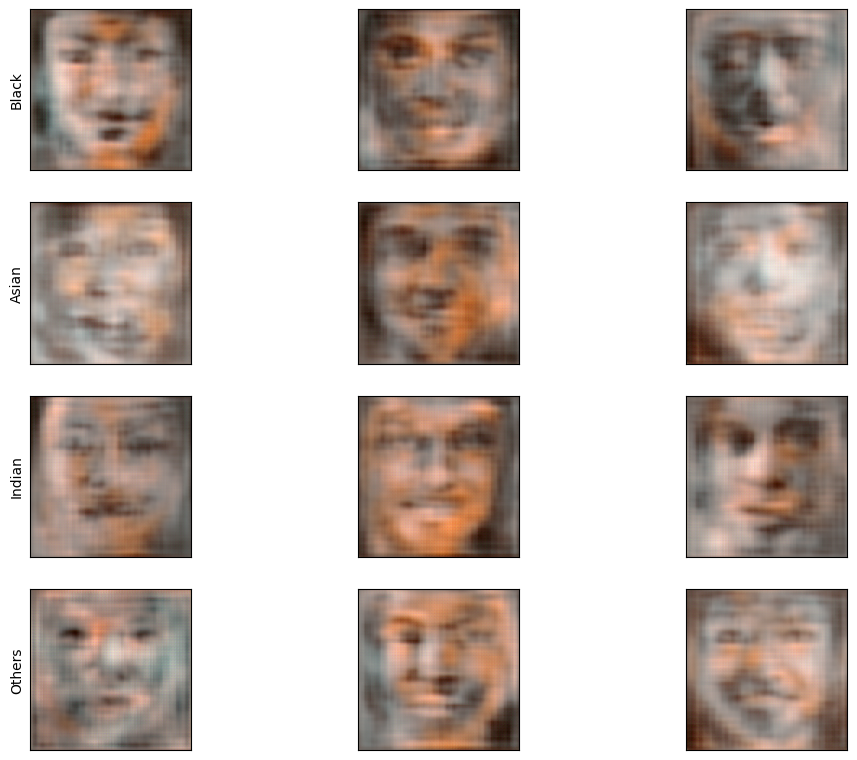

Epoch: 3 -- Generator Loss: 0.7369344830513, Discriminator Loss: 1.86516273021698

Took 83.05006885528564 seconds. 


Epoch:  4


100%|██████████| 70/70 [01:21<00:00,  1.17s/it]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


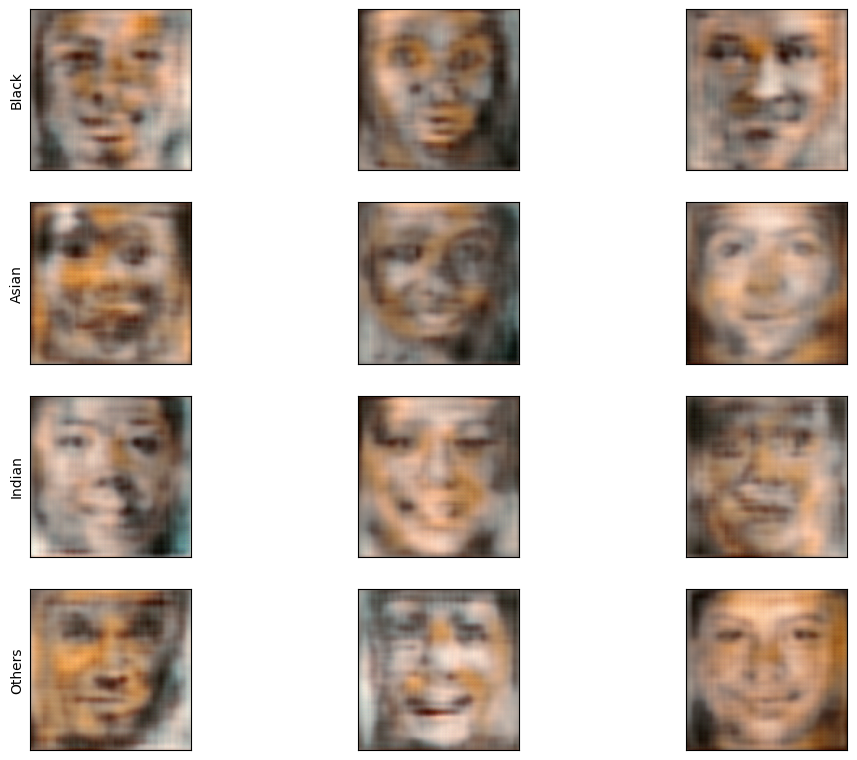

Epoch: 4 -- Generator Loss: 0.7421993613243103, Discriminator Loss: 1.8591907024383545

Took 83.8682861328125 seconds. 


Epoch:  5


100%|██████████| 70/70 [01:21<00:00,  1.17s/it]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


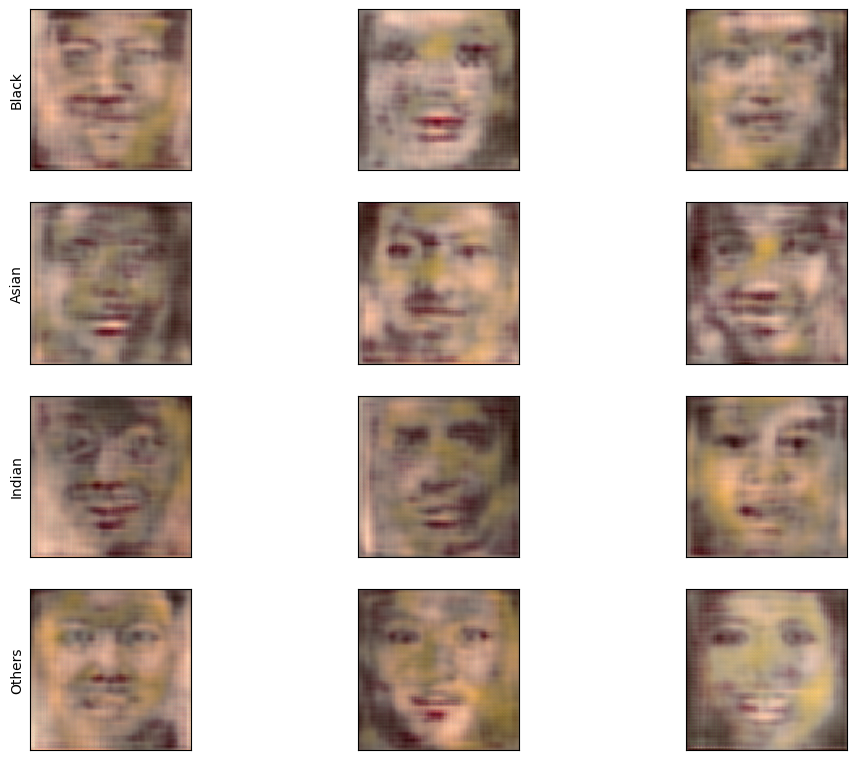

Epoch: 5 -- Generator Loss: 0.7524253726005554, Discriminator Loss: 1.846734881401062

Took 83.15410923957825 seconds. 


Epoch:  6


100%|██████████| 70/70 [01:21<00:00,  1.17s/it]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


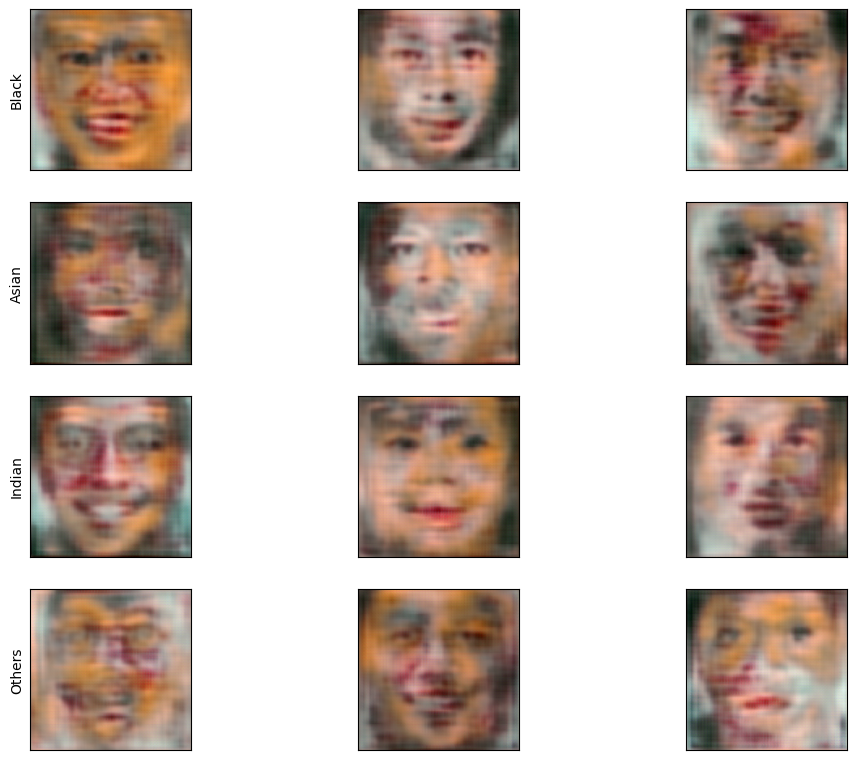

Epoch: 6 -- Generator Loss: 0.7633695602416992, Discriminator Loss: 1.8301376104354858

Took 83.1366708278656 seconds. 


Epoch:  7


100%|██████████| 70/70 [00:48<00:00,  1.43it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


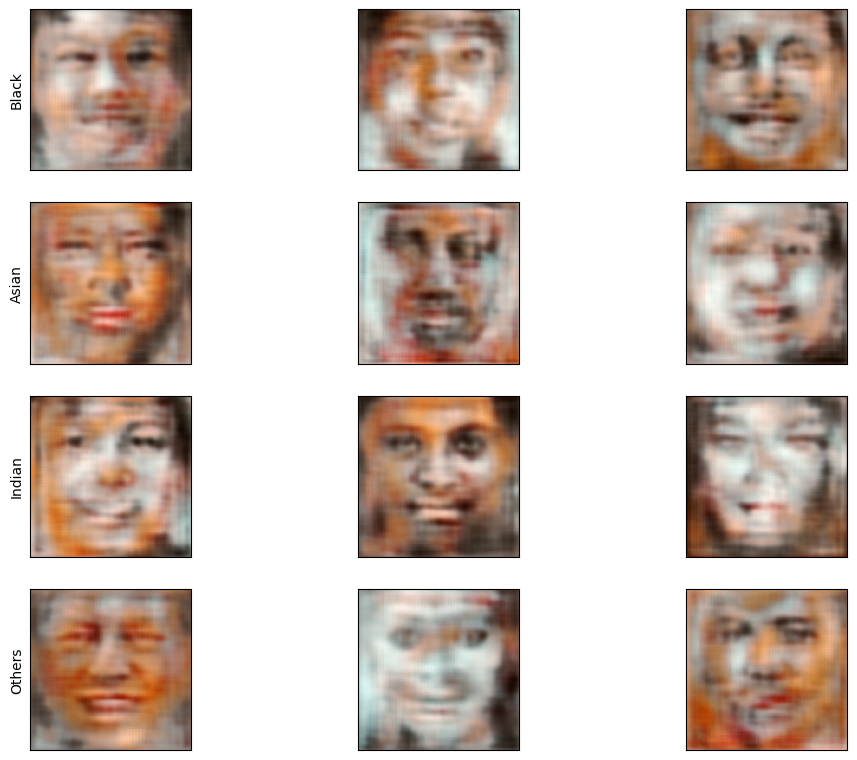

Epoch: 7 -- Generator Loss: 0.7741396427154541, Discriminator Loss: 1.8147660493850708

Took 50.60831046104431 seconds. 


Epoch:  8


100%|██████████| 70/70 [00:48<00:00,  1.45it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


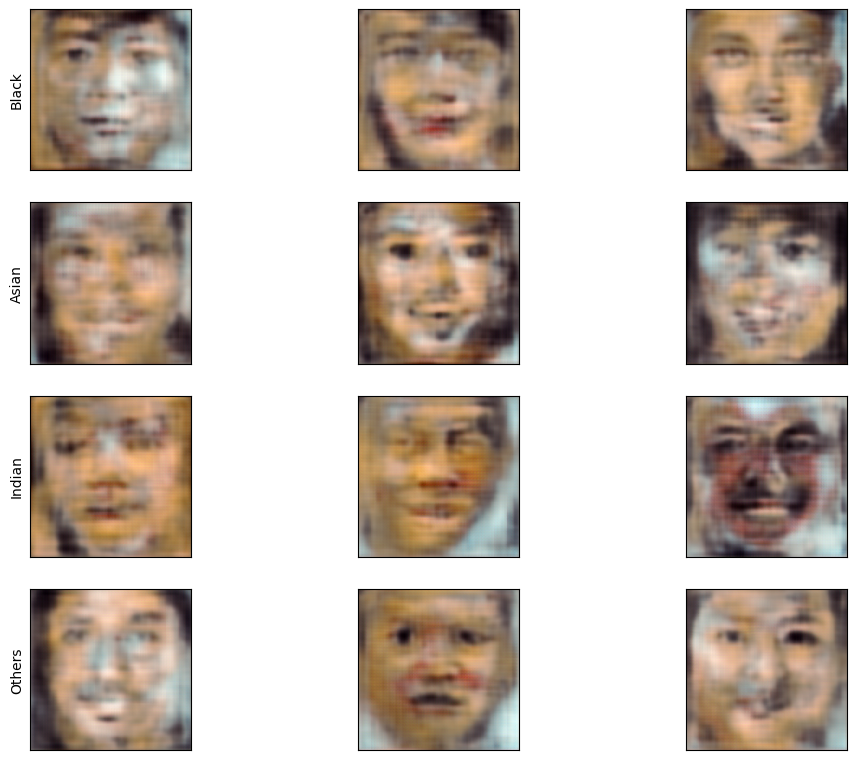

Epoch: 8 -- Generator Loss: 0.7855885028839111, Discriminator Loss: 1.8008313179016113

Took 49.67128849029541 seconds. 


Epoch:  9


100%|██████████| 70/70 [01:21<00:00,  1.17s/it]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


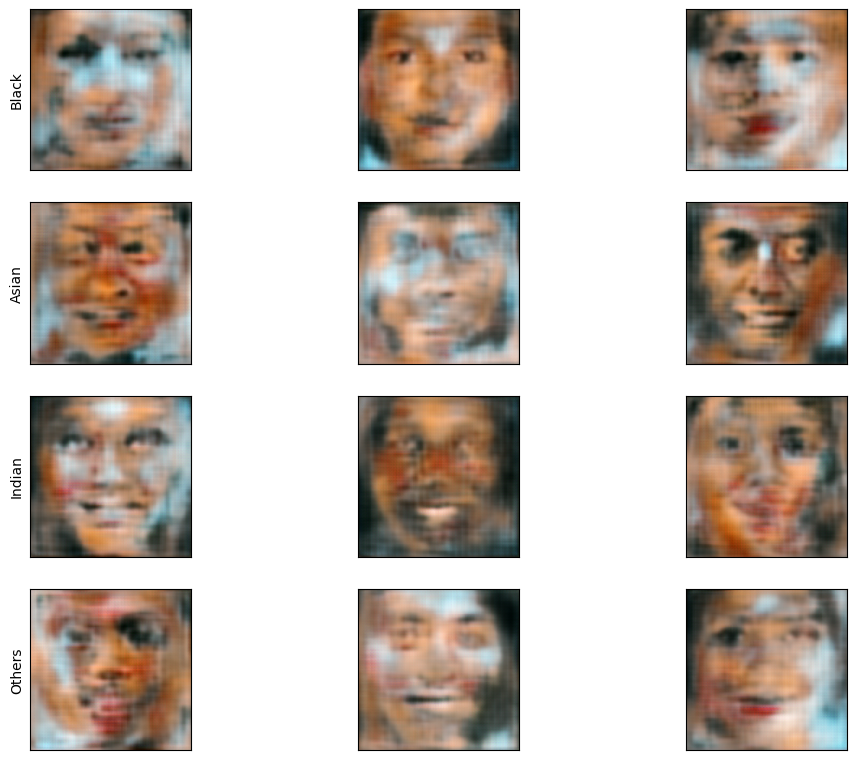

Epoch: 9 -- Generator Loss: 0.7961469292640686, Discriminator Loss: 1.7881768941879272

Took 83.21157574653625 seconds. 


Epoch:  10


100%|██████████| 70/70 [01:21<00:00,  1.17s/it]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


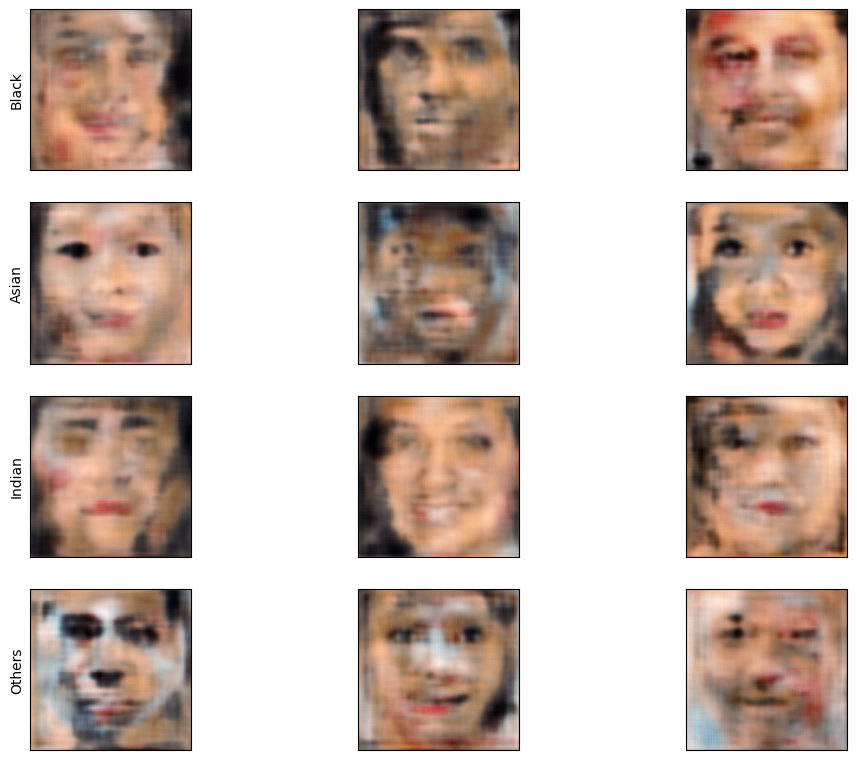

Epoch: 10 -- Generator Loss: 0.8062004446983337, Discriminator Loss: 1.776599407196045

Took 83.59340858459473 seconds. 


Epoch:  11


100%|██████████| 70/70 [01:21<00:00,  1.17s/it]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


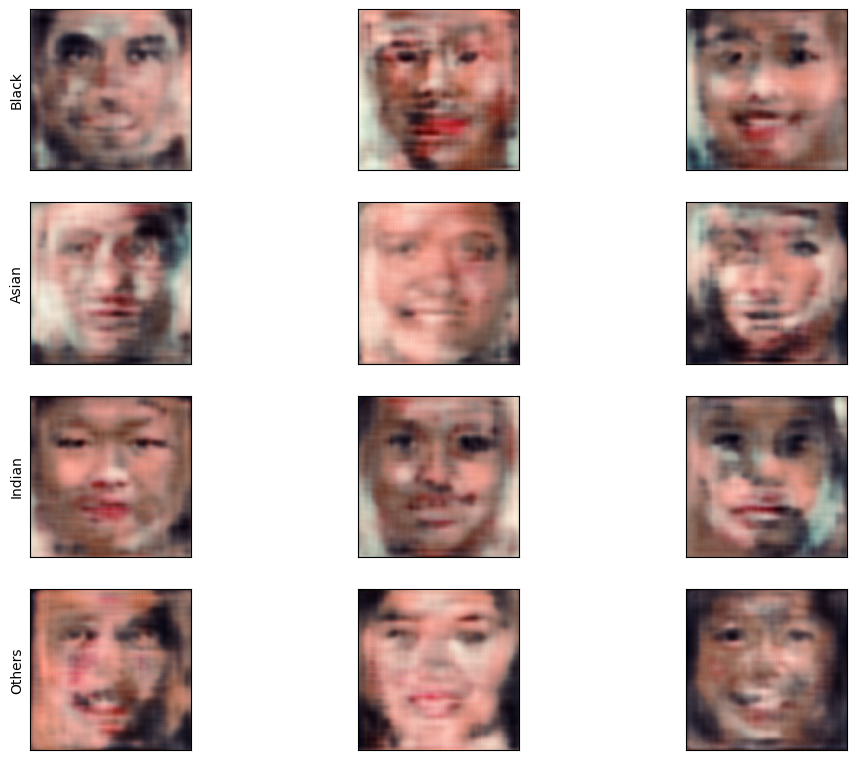

Epoch: 11 -- Generator Loss: 0.8160049915313721, Discriminator Loss: 1.7662967443466187

Took 83.23958659172058 seconds. 


Epoch:  12


100%|██████████| 70/70 [01:21<00:00,  1.17s/it]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


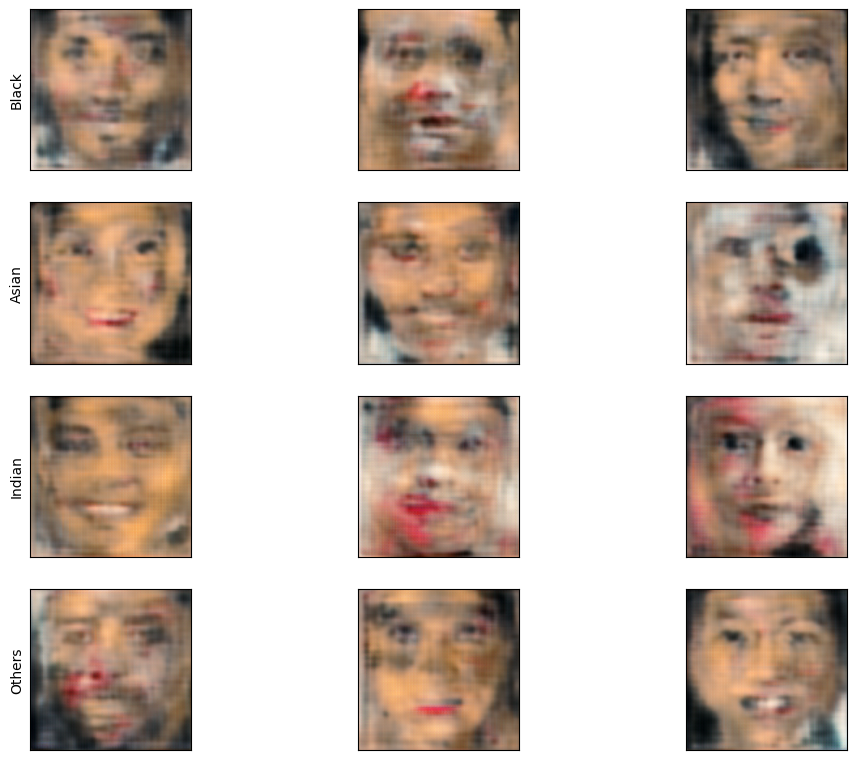

Epoch: 12 -- Generator Loss: 0.8256688714027405, Discriminator Loss: 1.7565714120864868

Took 83.25540280342102 seconds. 


Epoch:  13


100%|██████████| 70/70 [01:21<00:00,  1.17s/it]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


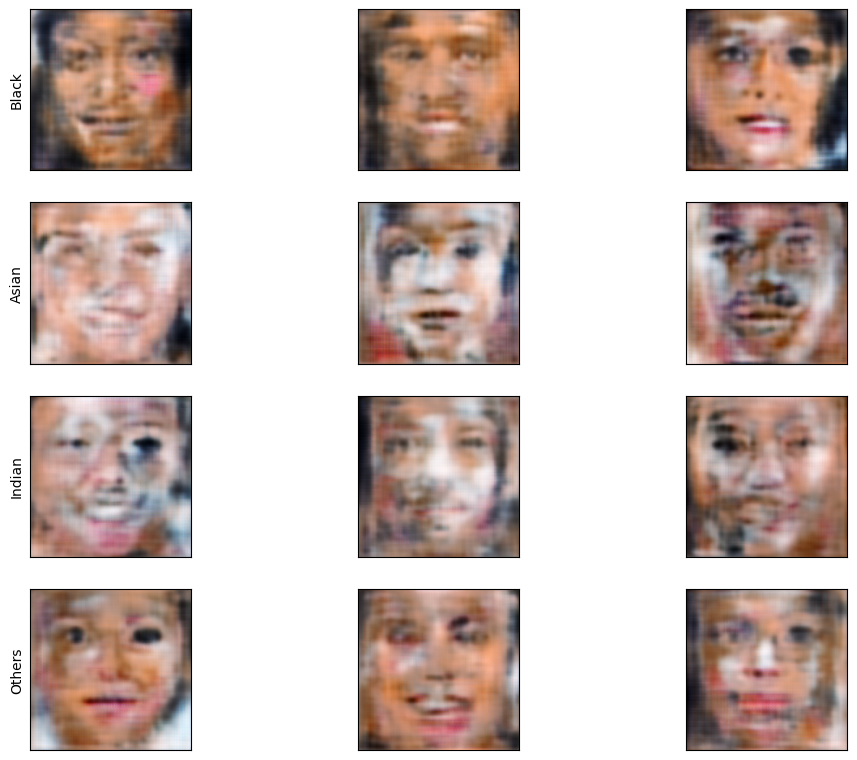

Epoch: 13 -- Generator Loss: 0.8347161412239075, Discriminator Loss: 1.747381329536438

Took 83.29312896728516 seconds. 


Epoch:  14


100%|██████████| 70/70 [01:21<00:00,  1.17s/it]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


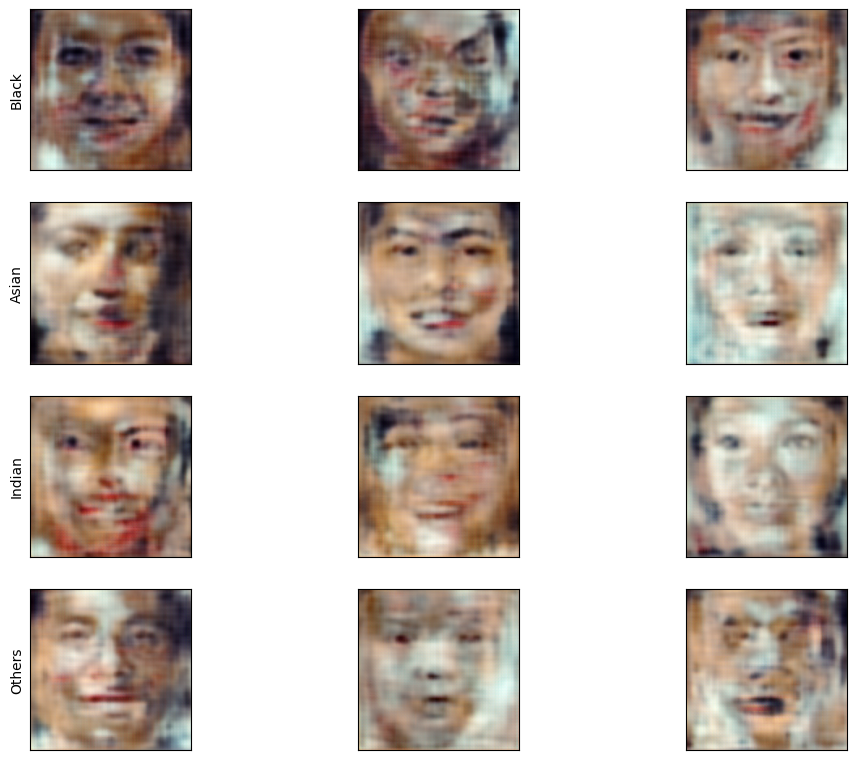

Epoch: 14 -- Generator Loss: 0.8437701463699341, Discriminator Loss: 1.7387508153915405

Took 83.25878500938416 seconds. 


Epoch:  15


100%|██████████| 70/70 [01:21<00:00,  1.17s/it]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


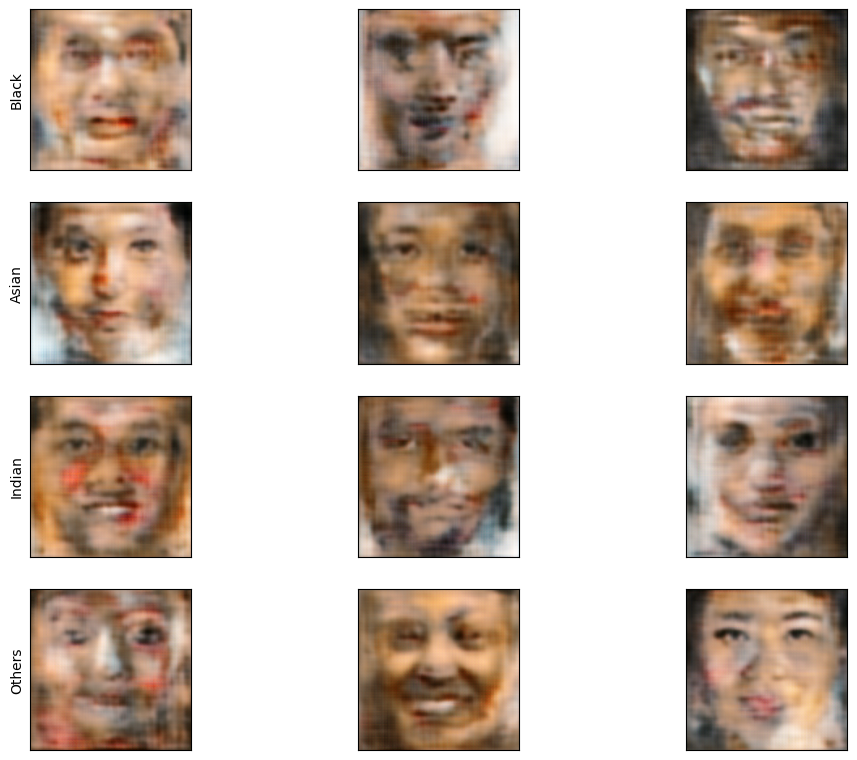

Epoch: 15 -- Generator Loss: 0.8523848056793213, Discriminator Loss: 1.7304872274398804

Took 83.3815655708313 seconds. 


Epoch:  16


100%|██████████| 70/70 [00:48<00:00,  1.43it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


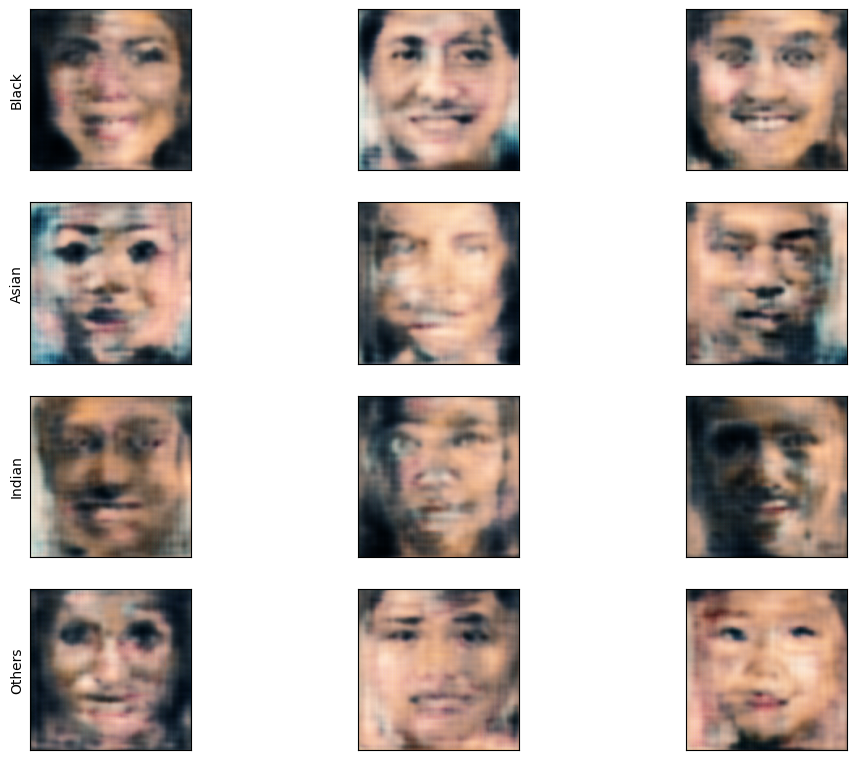

Epoch: 16 -- Generator Loss: 0.8607546091079712, Discriminator Loss: 1.7228021621704102

Took 51.33711504936218 seconds. 


Epoch:  17


100%|██████████| 70/70 [00:48<00:00,  1.44it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


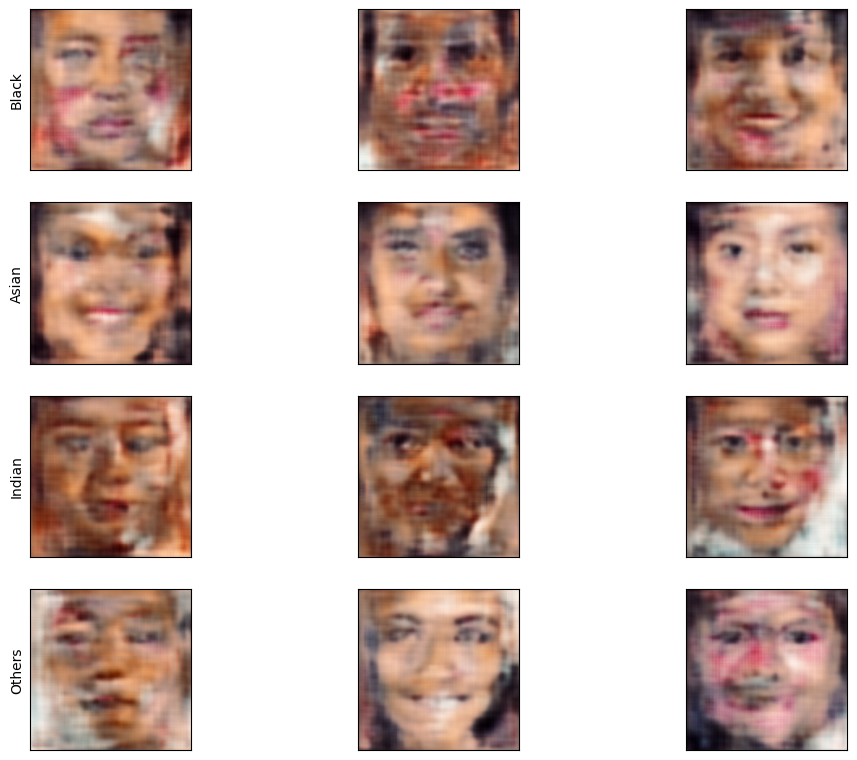

Epoch: 17 -- Generator Loss: 0.8687860369682312, Discriminator Loss: 1.7154536247253418

Took 50.24970102310181 seconds. 


Epoch:  18


100%|██████████| 70/70 [00:48<00:00,  1.43it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


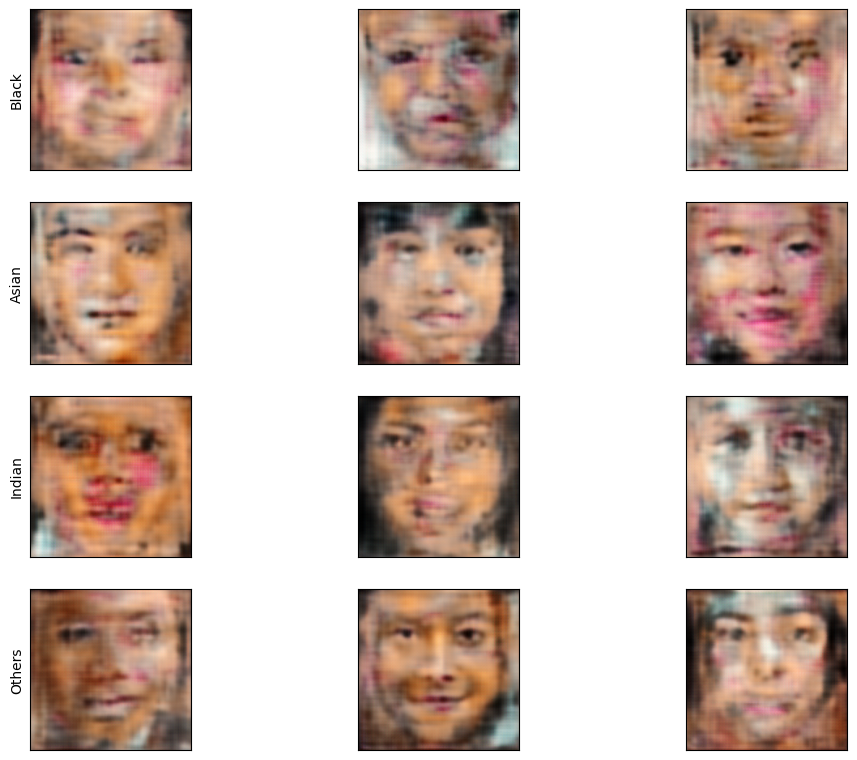

Epoch: 18 -- Generator Loss: 0.8764451742172241, Discriminator Loss: 1.7084722518920898

Took 50.28389358520508 seconds. 


Epoch:  19


100%|██████████| 70/70 [02:21<00:00,  2.03s/it]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


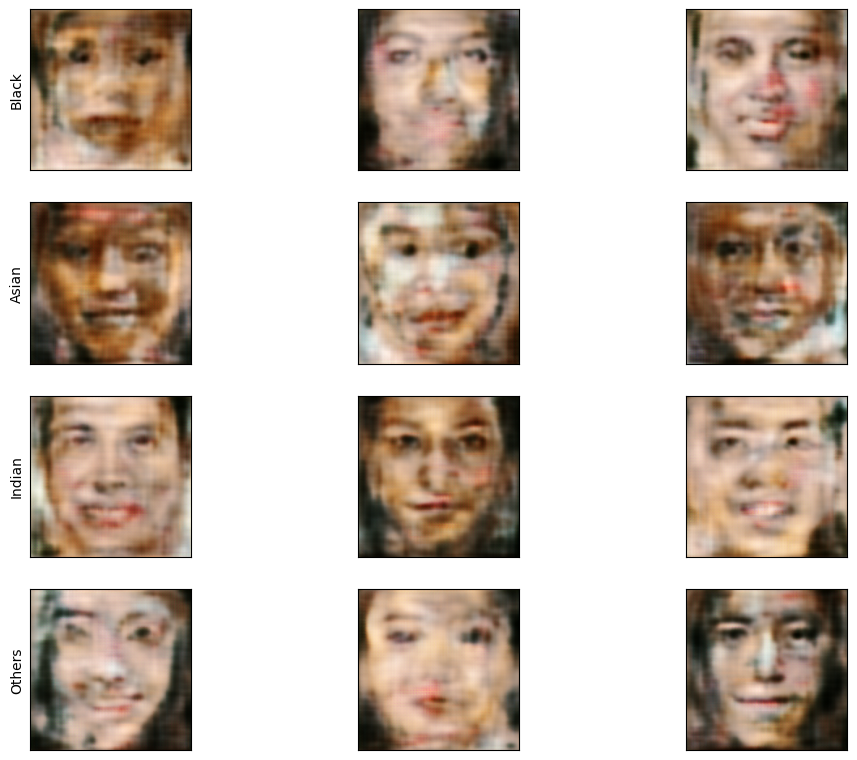

Epoch: 19 -- Generator Loss: 0.8837345242500305, Discriminator Loss: 1.7018330097198486

Took 143.41118216514587 seconds. 


Model saved to: /content/drive/Shareddrives/ProgettoSE4AI/train_model/GAN_G_Model_b64_eps20_lr_0.0003.keras
Model saved to: /content/drive/Shareddrives/ProgettoSE4AI/train_model/GAN_D_Model_b64_eps20_lr_0.0003.keras
🏃 View run likeable-colt-387 at: https://dagshub.com/simoLoc/ProgettoSE4AI.mlflow/#/experiments/1/runs/245d4b18580241ccb05650a54b9d1f33
🧪 View experiment at: https://dagshub.com/simoLoc/ProgettoSE4AI.mlflow/#/experiments/1


In [17]:
for batch_size in param_grid['batch_size']:
  # La funzione shuffle mescola gli elementi del dataset in modo casuale, per riga.
  # Mantiene quindi lo stesso allineamento per le feature considerate. Successivamente divide il dataset in batch.
  dataset = create_dataset(images_path, ethnicity_list, age_list, gender_list, batch_size)

  # dataset = dataset.shuffle(buffer_size=1000).batch(batch_size, drop_remainder=True)

  for epochs in param_grid['epochs']:
    for learning_rate in param_grid['learning_rate']:
      print(f"Training with batch_size={batch_size}, epochs={epochs}, learning_rate={learning_rate}")

      tf.keras.backend.clear_session()
      g_model = build_generator()
      d_model = build_discriminator()

      d_optimizer=Adam(learning_rate=learning_rate, beta_1 = 0.5)
      g_optimizer=Adam(learning_rate=learning_rate, beta_1 = 0.5)

      with mlflow.start_run():
        # Log iperparametri utilizzati
        mlflow.log_param("batch_size", batch_size)
        mlflow.log_param("epochs", epochs)
        mlflow.log_param("learning_rate", learning_rate)

        g_loss, d_loss, g_model, d_model, g_loss_list, d_loss_list = train(dataset, epochs, d_optimizer, g_optimizer,
                                                                            batch_size=batch_size, learning_rate = learning_rate)

        # Log delle loss del generatore e discriminatore
        mlflow.log_metric("generator_loss", g_loss)
        mlflow.log_metric("discriminator_loss", d_loss)

        loss_mean = np.array([g_loss, d_loss])
        loss_mean = np.mean(loss_mean)

        mlflow.log_metric("loss_mean", loss_mean)

        # Convert loss lists to standard Python floats before serializing
        g_loss_list_float = [float(loss) for loss in g_loss_list]
        d_loss_list_float = [float(loss) for loss in d_loss_list]

        # Scrivi su file
        with open("g_loss_list.json", "w") as f:
          json.dump(g_loss_list_float, f)
        with open("d_loss_list.json", "w") as f:
          json.dump(d_loss_list_float, f)

        # Logga come artifact
        mlflow.log_artifact("g_loss_list.json")
        mlflow.log_artifact("d_loss_list.json")

        run = {
            'batch_size': batch_size,
            'epochs': epochs,
            'learning_rate': learning_rate,
            'g_loss': g_loss,
            'd_loss': d_loss,
            'g_loss_list': g_loss_list,
            'd_loss_list': d_loss_list,
        }
        all_history.append(run)
        g_model_path = f'/content/drive/Shareddrives/ProgettoSE4AI/train_model/GAN_G_Model_b{batch_size}_eps{epochs}_lr_{learning_rate}.keras'
        g_model.save(g_model_path)
        print(f"Model saved to: {g_model_path}")

        d_model_path = f'/content/drive/Shareddrives/ProgettoSE4AI/train_model/GAN_D_Model_b{batch_size}_eps{epochs}_lr_{learning_rate}.keras'
        d_model.save(d_model_path)
        print(f"Model saved to: {d_model_path}")

        if g_loss < best_score:
          best_score = g_loss
          best_run = run
          best_d_model = copy.copy(d_model)
          best_g_model = copy.copy(g_model)


In [18]:
save_dir = '/content/drive/Shareddrives/ProgettoSE4AI/train_model'

learning_rate = best_run['learning_rate']
batch_size = best_run['batch_size']
epochs = best_run['epochs']

# salva il discriminatore
d_model_filename = f'Best_D_Model_b{batch_size}_eps{epochs}_lr_{learning_rate}.keras'
best_d_model.save(os.path.join(save_dir, d_model_filename))

# salva il generatore
g_model_filename = f'Best_G_Model_b{batch_size}_eps{epochs}_lr_{learning_rate}.keras'
best_g_model.save(os.path.join(save_dir, g_model_filename))

print(f"Best discriminator model saved to: {os.path.join(save_dir, d_model_filename)}")
print(f"Best generator model saved to: {os.path.join(save_dir, g_model_filename)}")


Best discriminator model saved to: /content/drive/Shareddrives/ProgettoSE4AI/train_model/Best_D_Model_b64_eps20_lr_0.0003.keras
Best generator model saved to: /content/drive/Shareddrives/ProgettoSE4AI/train_model/Best_G_Model_b64_eps20_lr_0.0003.keras


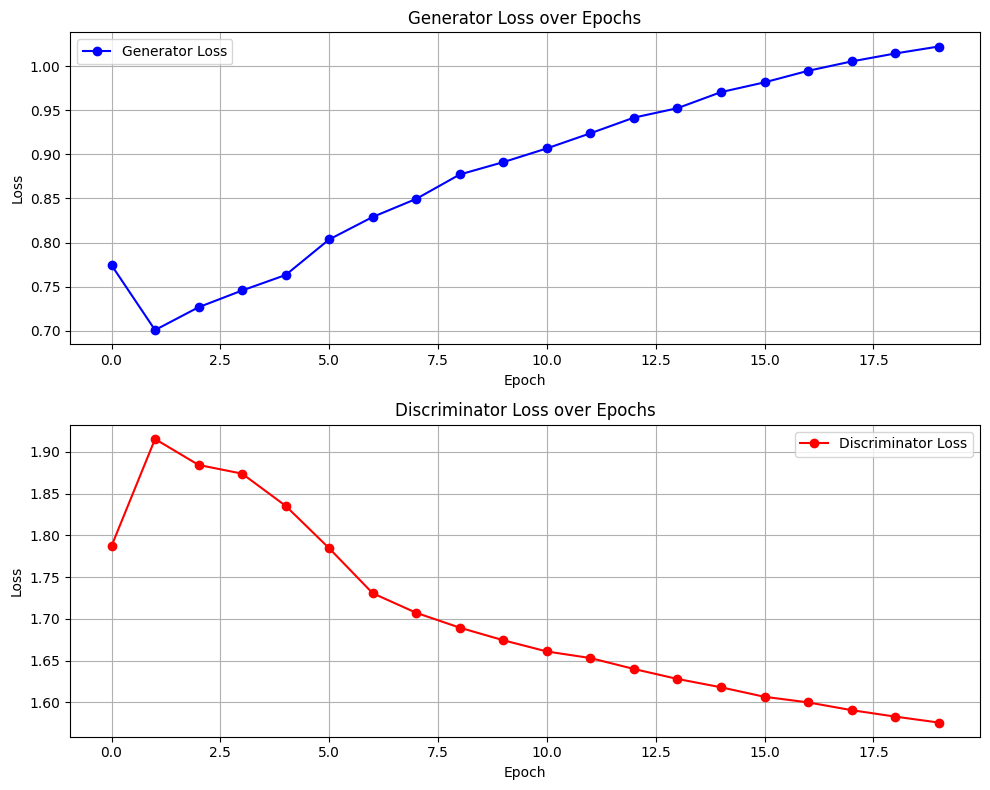

In [19]:
# Creazione dei grafici
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8))

# Grafico per g_loss_list
ax1.plot(g_loss_list, label='Generator Loss', marker='o', color='blue')
ax1.set_title('Generator Loss over Epochs')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.grid(True)
ax1.legend()

# Grafico per d_loss_list
ax2.plot(d_loss_list, label='Discriminator Loss', marker='o', color='red')
ax2.set_title('Discriminator Loss over Epochs')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Loss')
ax2.grid(True)
ax2.legend()

plt.tight_layout()
plt.show()